# Particle Cloud Simulation


Using the same setup as `detailed_look.jl` or `example2()`, here we simulate
a point cloud getting advected by the flow field.
For additional documentation e.g. see :
[1](https://JuliaClimate.github.io/IndividualDisplacements.jl/dev/),
[2](https://JuliaClimate.github.io/MeshArrays.jl/dev/),
[3](https://docs.juliadiffeq.org/latest/solvers/ode_solve.html),
[4](https://en.wikipedia.org/wiki/Displacement_(vector))

## 1. Import Software

In [1]:
using IndividualDisplacements, OrdinaryDiffEq, Statistics
p=dirname(pathof(IndividualDisplacements))
include(joinpath(p,"../examples/recipes_plots.jl"))
include(joinpath(p,"../examples/example123.jl"))

Main.##386.OCCA_setup

## 2. Setup Problem

In [2]:
𝑃,Γ=example2_setup()

ii1=5:5:40; ii2=5:5:25
x=vec([x-0.5 for x in ii1, y in ii2])
y=vec([y-0.5 for x in ii1, y in ii2])
xy=transpose([x y])

𝑃.𝑇[:] = [0.0,2998*3600.0]
solv(prob) = solve(prob,Tsit5(),reltol=1e-6,abstol=1e-6)
tr = DataFrame( ID=[], x=[], y=[], t = [])

𝐼 = Individuals{Float64}(xy=xy[:,:], 𝑃=𝑃, ⎔! = ⬡, □ = solv, ▽ = postprocess_xy, tr = tr)

Individuals{Float64}([4.5 9.5 … 34.5 39.5; 4.5 4.5 … 24.5 24.5], Int64[], 0×4 DataFrame
, IndividualDisplacements.dxy_dt, IndividualDisplacements.dxy_dt, Main.##386.solv, IndividualDisplacements.postprocess_xy, (u0 =   data type   = Float64
  cell pos.   = [0.5, 0.5, 0.5]
  tile array  = (1,)
  tile sizes  = (80, 42)
  grid class  = PeriodicChannel
  MeshArray   = gcmarray 
  version     = 0.2.12 
, u1 =   data type   = Float64
  cell pos.   = [0.5, 0.5, 0.5]
  tile array  = (1,)
  tile sizes  = (80, 42)
  grid class  = PeriodicChannel
  MeshArray   = gcmarray 
  version     = 0.2.12 
, v0 =   data type   = Float64
  cell pos.   = [0.5, 0.5, 0.5]
  tile array  = (1,)
  tile sizes  = (80, 42)
  grid class  = PeriodicChannel
  MeshArray   = gcmarray 
  version     = 0.2.12 
, v1 =   data type   = Float64
  cell pos.   = [0.5, 0.5, 0.5]
  tile array  = (1,)
  tile sizes  = (80, 42)
  grid class  = PeriodicChannel
  MeshArray   = gcmarray 
  version     = 0.2.12 
, dx = 5000.0, 𝑇 = [0.0, 1

## 3. Compute Trajectories

In [3]:
start!(𝐼)

2×40 Array{Float64,2}:
   5.91182   10.5953   11.087   12.6622  …  37.9639   29.12    30.6396
 -12.3525   124.028   487.117  478.34        8.68514  19.2392  22.4415

## 4. Display results

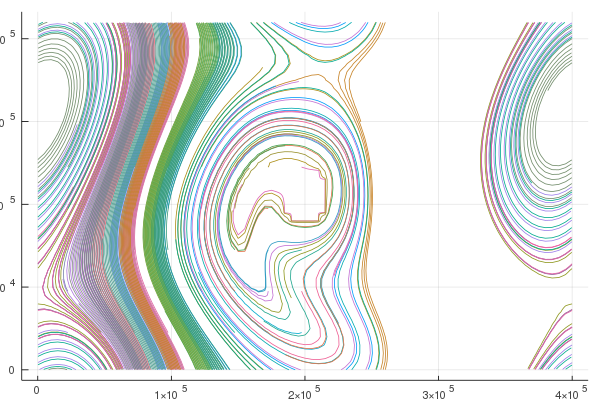

In [4]:
𝐼.tr.lon=5000*𝐼.tr.x
𝐼.tr.lat=5000*𝐼.tr.y
plt=PlotBasic(𝐼.tr,size(xy,2),100000.0)

Compare with trajectory output from `MITgcm`

In [5]:
#df=read_flt(joinpath(p,"../examples/flt_example/"),Float32)
#ref=PlotBasic(df,size(xy,2),100000.0)

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*